# Install Requirements

In [1]:
!pip install arabic-reshaper

In [2]:
!pip install python-bidi

# Libraries

In [3]:
# Disable all warnings
import warnings
warnings.filterwarnings('ignore')

In [4]:
import pandas as pd
from sklearn.model_selection import train_test_split
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import SnowballStemmer
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import sent_tokenize
import arabic_reshaper
from bidi.algorithm import get_display
import string
import re
import csv
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import numpy as np
from sklearn import preprocessing
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

# Download Packages

In [5]:
nltk.download('stopwords')  # download stopwords
nltk.download('punkt')  # download word_tokenize
nltk.download("wordnet")
nltk.download('omw-1.4')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

# Read the Data

In [6]:
stories_art = pd.read_csv("/content/stories_art-et-culture.csv", encoding='utf8')
stories_art = stories_art[['story', 'topic']]
stories_art

,story,topic
0,"وجه ""بيت الشعر في المغرب"" إلى وزير الثقافة وال...",art-et-culture
1,في ظلّ استمرار حالة الطوارئ الصحية المرتبطة بج...,art-et-culture
2,تشير مشاهدة فيلم قصير ضمن الثلاثية الأخيرة للم...,art-et-culture
3,"مِن قَلب أيّام ""الحَجْر""، رأتِ النّورَ الفصول ...",art-et-culture
4,أعلن الفنان المغربيّ سعيد مسكر تخليه عن مبلغ ا...,art-et-culture
...,...,...
995,تستمرّ الآثار الجانبية للانتقال الحكومي الأخير...,art-et-culture
996,"قال الدكتور المهدي السعيدي، في ندوة حول ""جهود ...",art-et-culture
997,أجمعت لجنة المسابقة الخاصة بالأفلام المغربية ا...,art-et-culture
998,ألوان حيّة ولمسات تعبيرية تحْمل مآسي إنسانية ل...,art-et-culture


In [7]:
stories_economie= pd.read_csv("/content/stories_economie.csv", encoding='utf8')
stories_economie = stories_economie[['story', 'topic']]
stories_economie

,story,topic
0,قال محمد أمكراز، وزير الشغل والإدماج المهني، إ...,economie
1,أثرت أزمة تفشي فيروس كورونا بشكل مباشر على أجا...,economie
2,سجلت البورصات الرئيسية الأوروبية تراجعا لدى بد...,economie
3,قال المجلس الاقتصادي والاجتماعي والبيئي إن اند...,economie
4,أجمع المتدخلون في اللقاء التواصلي الذي عقدته و...,economie
...,...,...
995,قال مسؤولون بقطاع توزيع المحروقات بالمغرب إن ت...,economie
996,في إطار الأنشطة المتعلقة بمواكبة القطاع الصناع...,economie
997,أحدثت وكالة التنمية الاجتماعية بوابة إلكترونية...,economie
998,المخاوف من اتساع بؤر تمركز فيروس كورونا المستج...,economie


In [8]:
stories_faits= pd.read_csv("/content/stories_faits-divers.csv", encoding='utf8')
stories_faits = stories_faits[['story', 'topic']]
stories_faits

,story,topic
0,قررت الغرفة الجنائية بمحكمة الاستئناف بمدينة ا...,faits-divers
1,تمكنت المصلحة الولائية للشرطة القضائية بمدينة ...,faits-divers
2,أوقفت عناصر فرقة الشرطة القضائية بالمنطقة الإق...,faits-divers
3,كشف مصدر أمني مسؤول أن التلميذة المتحدرة من جم...,faits-divers
4,تمكنت عناصر المصلحة الولائية للشرطة القضائية ب...,faits-divers
...,...,...
995,لفظ عامل بناء أنفاسه الأخيرة على الفور، أمس ال...,faits-divers
996,تمكنت عناصر المصلحة الولائية للشرطة القضائية ب...,faits-divers
997,أحالت عناصر الشرطة القضائية بولاية أمن مراكش، ...,faits-divers
998,أعلنت المديرية الجهوية لوزارة الصحة بجهة كلميم...,faits-divers


In [9]:
stories_marocains= pd.read_csv("/content/stories_marocains-du-monde.csv", encoding='utf8')
stories_marocains = stories_marocains[['story', 'topic']]
stories_marocains

,story,topic
0,بعد أكثر من ستّة أشهر من الإغلاق لحُدودهما الب...,marocains-du-monde
1,"نشرت الجريدة الصربية واسعة الانتشار ""بوليتيكا""...",marocains-du-monde
2,تأهل الشاب المغربي وائل أبرون، دكتور مهندس في ...,marocains-du-monde
3,لن يكون بمقدورِ المغاربة العالقين في مليلية وس...,marocains-du-monde
4,يشرع المغرب، غداً الأربعاء، في إعادة مئات المغ...,marocains-du-monde
...,...,...
995,أعلنت وزارة التربية الوطنية والتكوين المهني وا...,marocains-du-monde
996,لا يلفظ اسم العربي الحروشي في سلطنة عمان إلا و...,marocains-du-monde
997,طال المقام بالمغربية غزلان الصيابري في تجربة ا...,marocains-du-monde
998,يعيش هشام تسمارت أواخر سنين العقد الثالث من حي...,marocains-du-monde


In [10]:
stories_medias= pd.read_csv("/content/stories_medias.csv", encoding='utf8')
stories_medias = stories_medias[['story', 'topic']]
stories_medias

,story,topic
0,قراءة مواد بعض الجرائد الخاصة بنهاية الأسبوع ن...,medias
1,"قراءة رصيف صحافة الجمعة نستهلها من ""المساء""، ا...",medias
2,مطالعة أنباء بعض الجرائد الصادرة يوم الخميس نس...,medias
3,"قراءة رصيف صحافة يوم الأربعاء نستهلها من ""المس...",medias
4,قراءة مواد بعض الجرائد الخاصة بيوم الثلاثاء من...,medias
...,...,...
995,مستهل قراءة رصيف صحافة بداية الأسبوع من اعتراض...,medias
996,"قراءة مواد بعض الأسبوعيات من ""الأيام"" التي اهت...",medias
997,نستهل جولة رصيف صحافة نهاية الأسبوع من استنفار...,medias
998,"مستهل قراءة رصيف الصحافة من ""أخبار اليوم""، الت...",medias


In [11]:
stories_orbites= pd.read_csv("/content/stories_orbites.csv", encoding='utf8')
stories_orbites = stories_orbites[['story', 'topic']]
stories_orbites

,story,topic
0,تُبيّن التصريحات الأخيرة للأمين العام لجبهة ال...,orbites
1,تنطلقُ جلسات الحوار اللّيبي في مدينة بوزنيقة ا...,orbites
2,تنفيذا للتعليمات الملكية، استقبل عبد اللطيف لو...,orbites
3,وقعت المملكة المغربية والولايات المتحدة الأمري...,orbites
4,تواصل الناشطة الانفصالية أمينتو حيدر حملاتها ا...,orbites
...,...,...
995,أطروحة جديدة تُعنى بدراسة الأبعاد السيميائية ل...,orbites
996,تزامناً مع توجّه المغرب لترسيم حدوده في المياه...,orbites
997,قامت اللجنة الخاصة بالنموذج التنموي، خلال اجتم...,orbites
998,اختُتمت، السبت الماضي بمدينة أكادير، أشغال الم...,orbites


In [12]:
stories_politique = pd.read_csv("stories_politique.csv", encoding='utf8')
stories_politique = stories_politique[['story', 'topic']]
stories_politique

,story,topic
0,أكدت مصادر موثوقة لجريدة هسبريس الإلكترونية أن...,politique
1,شدد رئيس الحكومة، سعد الدين العثماني، على أن ا...,politique
2,يكاد يكون هناك إجماع على فشل الحكومة في تدبير ...,politique
3,عقد الحبيب المالكي، رئيس مجلس النواب، اجتماعا ...,politique
4,تُواصل الرباط تنشيط جهازها الدبلوماسي بخصوص ال...,politique
...,...,...
995,استقبل نزار بركة، الأمين العام لحزب الاستقلال،...,politique
996,قال ناصر بوريطة، وزير الشؤون الخارجية والتعاون...,politique
997,في آخر اللحظات تغير كل شيء ضمن الزيارة الأولى ...,politique
998,أجرى المدير العام للأمن الوطني، المدير العام ل...,politique


In [13]:
stories_regions = pd.read_csv("stories_regions.csv", encoding='utf8')
stories_regions = stories_regions[['story', 'topic']]
stories_regions

,story,topic
0,بلغ مؤشر الإصابة بفيروس كورونا في آخر 24 ساعة ...,regions
1,سجل إقليم سيدي إفني، اليوم الجمعة، أول وفاة نا...,regions
2,طالب ممثلو فرق المعارضة بمجلس جماعة صفرو، المن...,regions
3,توفي النائب الأول لرئيس بلدية الفقيه بنصالح، ب...,regions
4,نجح سكان مركز جماعة ملعب، الواقعة بالنفوذ الإد...,regions
...,...,...
995,كشفت المديرية الجهوية لوزارة الصحة بجهة درعة ت...,regions
996,تتوقع المديرية العامة للأرصاد الجوية، اليوم ال...,regions
997,في إطار دعم وتشجيع التمدرس بالجماعات الترابية ...,regions
998,أدى الارتفاع المهول في الحالات النشطة على مستو...,regions


In [14]:
stories_societe= pd.read_csv("stories_societe.csv", encoding='utf8')
stories_societe = stories_societe[['story', 'topic']]
stories_societe

,story,topic
0,كشفت معطيات وزارة الصحة، اليوم الجمعة، تسجيل 2...,societe
1,ظاهرة خُرافية مازالت حاضرة في المجتمع المغربي ...,societe
2,طرح نواب في لجنة العدل والتشريع وحقوق الإنسان،...,societe
3,تتجه جماعة الدار البيضاء إلى إنهاء أزمة معادلة...,societe
4,أعلنت وزيرة التضامن والتنمية الاجتماعية والمسا...,societe
...,...,...
995,قالت حركة الممرضين وتقنيي الصحة بالمغرب، إن عد...,societe
996,أشّر المدير العام للأمن الوطني، عبد اللطيف حمو...,societe
997,"قال المجلس الأعلى للسلطة القضائية إننا ""نسجل ب...",societe
998,كشفت وزارة الصحة، اليوم الاثنين، تسجيل 191 حال...,societe


In [15]:
stories_sport = pd.read_csv("stories_sport.csv", encoding='utf8')
stories_sport = stories_sport[['story', 'topic']]
stories_sport

,story,topic
0,رغم أن المستوى التقني العام لمباريات الدوري، م...,sport
1,أكد فرانك لامبارد، مدرب نادي تشيلسي الإنجليزي ...,sport
2,وافقت الإدارة التقنية التابعة للجامعة الملكية ...,sport
3,أعلن الاتحاد الدولي لكرة القدم (فيفا) في وقت م...,sport
4,"قررت ""الجامعة الملكية المغربية للكراطي وأساليب...",sport
...,...,...
995,‪ يراهن مسؤولو أيس ميلان الإيطالي لكرة القدم ع...,sport
996,تمكن فريق يوسفية برشيد من الفوز بميدانه على ات...,sport
997,دخل النجم المغربي الشاب يوسف النصيري بسرعة وجي...,sport
998,قدم الكاتب العام للكونفدرالية الإفريقية لكرة ا...,sport


In [16]:
stories_tamazight = pd.read_csv("stories_tamazight.csv", encoding='utf8')
stories_tamazight = stories_tamazight[['story', 'topic']]
stories_tamazight

,story,topic
0,قالت وزارة التربية الوطنية والتكوين المهني وال...,tamazight
1,طالبت الكتابة الإقليمية للجامعة الوطنية للتعلي...,tamazight
2,أفاد المرصد الأمازيغي للحقوق والحريات أنه توصل...,tamazight
3,سجلت فعاليات مدنية أمازيغية عديدة امتعاضها من ...,tamazight
4,من داخل سيارة بسيطة يركنها بالمدخل الشمالي لمد...,tamazight
...,...,...
995,دافع ناشطون أمازيغ استقبلوا أخيرا وفدا من الطل...,tamazight
996,خاضت الشاعرة الأمازيغية ملكية مزان اعتصاما لمد...,tamazight
997,أدانت المنسقية الوطنية للمبادرة الطلابية ضد ال...,tamazight
998,طالبت الناشطة الأمازيغية مريم الدمناتي بضرورة ...,tamazight


# Splite Train and Test Data

## stories_art

In [17]:
train_stories_art = stories_art[:800]
test_stories_art = stories_art[800:]

In [18]:
train_stories_art

,story,topic
0,"وجه ""بيت الشعر في المغرب"" إلى وزير الثقافة وال...",art-et-culture
1,في ظلّ استمرار حالة الطوارئ الصحية المرتبطة بج...,art-et-culture
2,تشير مشاهدة فيلم قصير ضمن الثلاثية الأخيرة للم...,art-et-culture
3,"مِن قَلب أيّام ""الحَجْر""، رأتِ النّورَ الفصول ...",art-et-culture
4,أعلن الفنان المغربيّ سعيد مسكر تخليه عن مبلغ ا...,art-et-culture
...,...,...
795,هناك وافدان جديدان على الفيلم الطويل، وهما علا...,art-et-culture
796,نُشرت، حديثا، النّصوص الأدبية للكاتب المغربي م...,art-et-culture
797,"تعود ""النّشرة الأثرية المغربية""، في عددها الرّ...",art-et-culture
798,"اكتشف تلاميذ مؤسّسَتي ""طلحة بن عبيد الله"" و""يع...",art-et-culture


In [19]:
test_stories_art

,story,topic
800,وفق نمط موسيقي مختلف عمّا قدّمه سابقا، طرح الف...,art-et-culture
801,نصوصها ضفائر من مشهد فسيفسائي. الكلمات رقراقة ...,art-et-culture
802,"احتفظ الجزء الجديد من سلسلة أفلام حرب النجوم ""...",art-et-culture
803,أبدى المسرحي المغربي عبد الكريم برشيد تفاؤله ب...,art-et-culture
804,لم تكتف المخرجة المغربية مريم توزاني بسرد وتصو...,art-et-culture
...,...,...
995,تستمرّ الآثار الجانبية للانتقال الحكومي الأخير...,art-et-culture
996,"قال الدكتور المهدي السعيدي، في ندوة حول ""جهود ...",art-et-culture
997,أجمعت لجنة المسابقة الخاصة بالأفلام المغربية ا...,art-et-culture
998,ألوان حيّة ولمسات تعبيرية تحْمل مآسي إنسانية ل...,art-et-culture


## stories_economie

In [20]:
train_stories_economie = stories_economie[:800]
test_stories_economie = stories_economie[800:]

In [21]:
train_stories_economie

,story,topic
0,قال محمد أمكراز، وزير الشغل والإدماج المهني، إ...,economie
1,أثرت أزمة تفشي فيروس كورونا بشكل مباشر على أجا...,economie
2,سجلت البورصات الرئيسية الأوروبية تراجعا لدى بد...,economie
3,قال المجلس الاقتصادي والاجتماعي والبيئي إن اند...,economie
4,أجمع المتدخلون في اللقاء التواصلي الذي عقدته و...,economie
...,...,...
795,باءت مفاوضات إدارة شركة الخطوط الملكية المغربي...,economie
796,فجأة تفجرت بؤرة صناعية جديدة لفيروس كورونا الم...,economie
797,خلصت دراسة صادرة عن المجلس الإقليمي للسياحة بم...,economie
798,وقعت شركات أوروبية على بروتوكولات لاتفاقيات ته...,economie


In [22]:
test_stories_economie

,story,topic
800,كلف دعم أسعار مادتي غاز البوتان والسكر خلال ال...,economie
801,أصبحت الكمامات جزءا لا يتجزأ من حياتنا اليومية...,economie
802,وقّع كل من محمد بنشعبون، وزير الاقتصاد والمالي...,economie
803,لم تستسغ مجموعة من الهيئات الجهوية للتجار المش...,economie
804,"حيّنت وكالة ""فيتش"" الدولية للتصنيف الائتماني ت...",economie
...,...,...
995,قال مسؤولون بقطاع توزيع المحروقات بالمغرب إن ت...,economie
996,في إطار الأنشطة المتعلقة بمواكبة القطاع الصناع...,economie
997,أحدثت وكالة التنمية الاجتماعية بوابة إلكترونية...,economie
998,المخاوف من اتساع بؤر تمركز فيروس كورونا المستج...,economie


## stories_faits

In [23]:
train_stories_faits = stories_faits[:800]
test_stories_faits = stories_faits[800:]

In [24]:
train_stories_faits

,story,topic
0,قررت الغرفة الجنائية بمحكمة الاستئناف بمدينة ا...,faits-divers
1,تمكنت المصلحة الولائية للشرطة القضائية بمدينة ...,faits-divers
2,أوقفت عناصر فرقة الشرطة القضائية بالمنطقة الإق...,faits-divers
3,كشف مصدر أمني مسؤول أن التلميذة المتحدرة من جم...,faits-divers
4,تمكنت عناصر المصلحة الولائية للشرطة القضائية ب...,faits-divers
...,...,...
795,تمكنت عناصر من الدرك البحري بطنجة، اليوم الأحد...,faits-divers
796,تمكنت عناصر الوقاية المدنية من انتشال جثة قاصر...,faits-divers
797,تمكنت مصالح المركز الترابي للدرك الملكي بتزنيت...,faits-divers
798,تمكنت عناصر الدرك الملكي بمركز بلفاع، ضواحي اش...,faits-divers


In [25]:
test_stories_faits

,story,topic
800,عُثر، مساء السبت، على رضيع حديث الولادة متخلى ...,faits-divers
801,تمكنت المصلحة الولائية للشرطة القضائية بمدينة ...,faits-divers
802,أوقفت عناصر الفرقة الوطنية للشرطة القضائية، بت...,faits-divers
803,استقبل مستودع الأموات بالمستشفى المحلي بمدينة ...,faits-divers
804,تعرض زوج يبلغ من العمر 47 سنة لطعنة سكين على م...,faits-divers
...,...,...
995,لفظ عامل بناء أنفاسه الأخيرة على الفور، أمس ال...,faits-divers
996,تمكنت عناصر المصلحة الولائية للشرطة القضائية ب...,faits-divers
997,أحالت عناصر الشرطة القضائية بولاية أمن مراكش، ...,faits-divers
998,أعلنت المديرية الجهوية لوزارة الصحة بجهة كلميم...,faits-divers


## stories_marocains

In [26]:
train_stories_marocains = stories_marocains[:800]
test_stories_marocains = stories_marocains[800:]

In [27]:
train_stories_marocains

,story,topic
0,بعد أكثر من ستّة أشهر من الإغلاق لحُدودهما الب...,marocains-du-monde
1,"نشرت الجريدة الصربية واسعة الانتشار ""بوليتيكا""...",marocains-du-monde
2,تأهل الشاب المغربي وائل أبرون، دكتور مهندس في ...,marocains-du-monde
3,لن يكون بمقدورِ المغاربة العالقين في مليلية وس...,marocains-du-monde
4,يشرع المغرب، غداً الأربعاء، في إعادة مئات المغ...,marocains-du-monde
...,...,...
795,خلدت السفارة المغربية والقنصليات العامة للمغرب...,marocains-du-monde
796,أعلن رئيس الوزراء الفرنسي إدوارد فيليب، الاثني...,marocains-du-monde
797,بعد نجاح القنصلية المتنقلة الأولى التي نظمتها ...,marocains-du-monde
798,أحيت سفارة المغرب بالمنامة، الذكرى الـ63 لعيد ...,marocains-du-monde


In [28]:
test_stories_marocains

,story,topic
800,ينظم مجلس الجالية المغربية بالخارج، بشراكة مع ...,marocains-du-monde
801,"نظمت سفارة المملكة المغربية ببروكسيل، بمقر ""ال...",marocains-du-monde
802,تنظم الوزارة المنتدبة المكلفة بالمغاربة المقيم...,marocains-du-monde
803,تقدمت هيئة الدفاع عن إمام مغربي، كان يشتغل خطي...,marocains-du-monde
804,نظمت سفارة المملكة المغربية ببلجيكا، بتنسيق مع...,marocains-du-monde
...,...,...
995,أعلنت وزارة التربية الوطنية والتكوين المهني وا...,marocains-du-monde
996,لا يلفظ اسم العربي الحروشي في سلطنة عمان إلا و...,marocains-du-monde
997,طال المقام بالمغربية غزلان الصيابري في تجربة ا...,marocains-du-monde
998,يعيش هشام تسمارت أواخر سنين العقد الثالث من حي...,marocains-du-monde


## stories_medias

In [29]:
train_stories_medias = stories_medias[:800]
test_stories_medias = stories_medias[800:]

In [30]:
train_stories_medias

,story,topic
0,قراءة مواد بعض الجرائد الخاصة بنهاية الأسبوع ن...,medias
1,"قراءة رصيف صحافة الجمعة نستهلها من ""المساء""، ا...",medias
2,مطالعة أنباء بعض الجرائد الصادرة يوم الخميس نس...,medias
3,"قراءة رصيف صحافة يوم الأربعاء نستهلها من ""المس...",medias
4,قراءة مواد بعض الجرائد الخاصة بيوم الثلاثاء من...,medias
...,...,...
795,"نستهل جولتنا في رصيف صحافة الثلاثاء من ""المساء...",medias
796,قرر المجلس الأعلى للاتصال السمعي البصري الوقف ...,medias
797,مطالعة أنباء بعض الجرائد الورقية الخاص بمطلع ا...,medias
798,"قراءة مواد بعض الأسبوعيات من ""الأيام"" التي نشر...",medias


In [31]:
test_stories_medias

,story,topic
800,قراءة مواد بعض الجرائد الورقية الخاصة بنهاية ا...,medias
801,لم يستثن دفاع المطالبات بالحق المدني في ملف ال...,medias
802,يواصل المهنيون العاملون في قطاع الصحافة المكتو...,medias
803,قراءة مواد الورقيات اليومية الخاصة بيوم الجمعة...,medias
804,"مستهل جولة رصيف صحافة الخميس من ""المساء"" التي ...",medias
...,...,...
995,مستهل قراءة رصيف صحافة بداية الأسبوع من اعتراض...,medias
996,"قراءة مواد بعض الأسبوعيات من ""الأيام"" التي اهت...",medias
997,نستهل جولة رصيف صحافة نهاية الأسبوع من استنفار...,medias
998,"مستهل قراءة رصيف الصحافة من ""أخبار اليوم""، الت...",medias


## stories_orbites

In [32]:
train_stories_orbites = stories_orbites[:800]
test_stories_orbites = stories_orbites[800:]

In [33]:
train_stories_orbites

,story,topic
0,تُبيّن التصريحات الأخيرة للأمين العام لجبهة ال...,orbites
1,تنطلقُ جلسات الحوار اللّيبي في مدينة بوزنيقة ا...,orbites
2,تنفيذا للتعليمات الملكية، استقبل عبد اللطيف لو...,orbites
3,وقعت المملكة المغربية والولايات المتحدة الأمري...,orbites
4,تواصل الناشطة الانفصالية أمينتو حيدر حملاتها ا...,orbites
...,...,...
795,نقاش متقاطب جمع الباحثين المغربيّين الطيب بياض...,orbites
796,قال وزير الصحة خالد آيت الطالب، اليوم السبت في...,orbites
797,"قال سيون أسيدون، الناشط المغربي في حركة ""بي دي...",orbites
798,عبّر محامي أسرة المهدي بنبركة، موريس بوتان، عن...,orbites


In [34]:
test_stories_orbites

,story,topic
800,"يستمرُّ ""الجفاءُ"" الدّبلوماسي بين أمستردام وال...",orbites
801,أثارت صورة لسفير فلسطين بالجزائر، أمين مقبول، ...,orbites
802,قال الدكتور محمد سبيلا، المفكر المغربي المتخصص...,orbites
803,صدر في شهر فبراير الجاري (2020) عن مركز الدراس...,orbites
804,"قاربَ مجموعة من الباحثين موضوع ""العربيّة في ال...",orbites
...,...,...
995,أطروحة جديدة تُعنى بدراسة الأبعاد السيميائية ل...,orbites
996,تزامناً مع توجّه المغرب لترسيم حدوده في المياه...,orbites
997,قامت اللجنة الخاصة بالنموذج التنموي، خلال اجتم...,orbites
998,اختُتمت، السبت الماضي بمدينة أكادير، أشغال الم...,orbites


## stories_politique

In [35]:
train_stories_politique = stories_politique[:800]
test_stories_politique = stories_politique[800:]

In [36]:
train_stories_politique

,story,topic
0,أكدت مصادر موثوقة لجريدة هسبريس الإلكترونية أن...,politique
1,شدد رئيس الحكومة، سعد الدين العثماني، على أن ا...,politique
2,يكاد يكون هناك إجماع على فشل الحكومة في تدبير ...,politique
3,عقد الحبيب المالكي، رئيس مجلس النواب، اجتماعا ...,politique
4,تُواصل الرباط تنشيط جهازها الدبلوماسي بخصوص ال...,politique
...,...,...
795,وجّه ناصر بوريطة، وزير الشؤون الخارجية والتعاو...,politique
796,قال الحسن عبيابة، وزير الثقافة والشباب والرياض...,politique
797,قال عبد اللطيف وهبي، عضو المكتب السياسي لحزب ا...,politique
798,أكّدت اللجنة المركزية لحزب الطليعة الديمقراطي ...,politique


In [37]:
test_stories_politique

,story,topic
800,تحت تصفيقات حارة، صادق البرلمان المغربي، مساء ...,politique
801,استقبل ناصر بوريطة، وزير الشؤون الخارجية والتع...,politique
802,"انْتهى مؤتمر ""برلين"" حول ليبيا كما بدأ، وعادَ ...",politique
803,قال سعد الدين العثماني، رئيس الحكومة، إن تحقيق...,politique
804,ينعقد يوم الخميس المقبل، مجلس للحكومة برئاسة س...,politique
...,...,...
995,استقبل نزار بركة، الأمين العام لحزب الاستقلال،...,politique
996,قال ناصر بوريطة، وزير الشؤون الخارجية والتعاون...,politique
997,في آخر اللحظات تغير كل شيء ضمن الزيارة الأولى ...,politique
998,أجرى المدير العام للأمن الوطني، المدير العام ل...,politique


## stories_regions

In [38]:
train_stories_regions = stories_regions[:800]
test_stories_regions = stories_regions[800:]

In [39]:
train_stories_regions

,story,topic
0,بلغ مؤشر الإصابة بفيروس كورونا في آخر 24 ساعة ...,regions
1,سجل إقليم سيدي إفني، اليوم الجمعة، أول وفاة نا...,regions
2,طالب ممثلو فرق المعارضة بمجلس جماعة صفرو، المن...,regions
3,توفي النائب الأول لرئيس بلدية الفقيه بنصالح، ب...,regions
4,نجح سكان مركز جماعة ملعب، الواقعة بالنفوذ الإد...,regions
...,...,...
795,بعد تشديد المراقبة الأمنية على مداخل المدن الو...,regions
796,"تخوض الشغيلة الصحية العاملة بجناح ""كوفيد-19"" ب...",regions
797,قضت المحكمة الإدارية الابتدائية بمراكش، الثلاث...,regions
798,في جماعة أغبالة الواقعة على ارتفاع يتجاوز 1400...,regions


In [40]:
test_stories_regions

,story,topic
800,متحدية حالة الطوارئ الصحية ومخالفة لتعليمات ال...,regions
801,أحصت جهة درعة تافيلالت، خلال 24 ساعة، 78 إصابة...,regions
802,"أودى وباء ""كورونا""، خلال الـ24 ساعة الأخيرة، ب...",regions
803,سجّلت جهة بني ملال خنيفرة، الثلاثاء، 190 إصابة...,regions
804,حزمٌ كبير تُبديهِ السّلطات المحليّة في مدينة ط...,regions
...,...,...
995,كشفت المديرية الجهوية لوزارة الصحة بجهة درعة ت...,regions
996,تتوقع المديرية العامة للأرصاد الجوية، اليوم ال...,regions
997,في إطار دعم وتشجيع التمدرس بالجماعات الترابية ...,regions
998,أدى الارتفاع المهول في الحالات النشطة على مستو...,regions


## stories_societe

In [41]:
train_stories_societe = stories_societe[:800]
test_stories_societe = stories_societe[800:]

In [42]:
train_stories_societe

,story,topic
0,كشفت معطيات وزارة الصحة، اليوم الجمعة، تسجيل 2...,societe
1,ظاهرة خُرافية مازالت حاضرة في المجتمع المغربي ...,societe
2,طرح نواب في لجنة العدل والتشريع وحقوق الإنسان،...,societe
3,تتجه جماعة الدار البيضاء إلى إنهاء أزمة معادلة...,societe
4,أعلنت وزيرة التضامن والتنمية الاجتماعية والمسا...,societe
...,...,...
795,غموض يلفّ المعالم الأساسية المرتبطة بالموسم ال...,societe
796,في ظلّ استمرار حالة الطوارئ الصحية وما يرافقها...,societe
797,أقدمت وزارتا الداخلية والفلاحة والصيد البحري و...,societe
798,على الرغم من الظروف الاستثنائية التي فرضتها أج...,societe


In [43]:
test_stories_societe

,story,topic
800,أعلنت إسبانيا تنظيم رحلتين بحريتين جديدتين لنق...,societe
801,"أكدت المندوبية السامية للتخطيط، أن 56,2 في الم...",societe
802,كشفت وزارة الصحة، اليوم الثلاثاء، تسجيل 500 حا...,societe
803,كشف رشيد الخلفي، رئيس قسم التتبع بمديرية الشؤو...,societe
804,تبخّر حلم عدد كبير من مربيّات التعليم الأولي ا...,societe
...,...,...
995,قالت حركة الممرضين وتقنيي الصحة بالمغرب، إن عد...,societe
996,أشّر المدير العام للأمن الوطني، عبد اللطيف حمو...,societe
997,"قال المجلس الأعلى للسلطة القضائية إننا ""نسجل ب...",societe
998,كشفت وزارة الصحة، اليوم الاثنين، تسجيل 191 حال...,societe


## stories_sport

In [44]:
train_stories_sport = stories_sport[:800]
test_stories_sport = stories_sport[800:]

In [45]:
train_stories_sport

,story,topic
0,رغم أن المستوى التقني العام لمباريات الدوري، م...,sport
1,أكد فرانك لامبارد، مدرب نادي تشيلسي الإنجليزي ...,sport
2,وافقت الإدارة التقنية التابعة للجامعة الملكية ...,sport
3,أعلن الاتحاد الدولي لكرة القدم (فيفا) في وقت م...,sport
4,"قررت ""الجامعة الملكية المغربية للكراطي وأساليب...",sport
...,...,...
795,يسعى مسؤولو بوروسيا دورتموند الألماني لكرة الق...,sport
796,أكدت تقارير مصرية أن إدارة نادي الزمالك استقرت...,sport
797,يدرس مسؤولو نادي الوداد الرياضي لكرة القدم ابت...,sport
798,يعتبر الدولي المغربي أشرف حكيمي، المعار إلى بو...,sport


In [46]:
test_stories_sport

,story,topic
800,يرتقب أن يغادر الدولي المغربي كريم الأحمدي، لا...,sport
801,وجّه مغربي الأصل بلجيكي الجنسية مروان فيلايني،...,sport
802,يعتبر المهاجم المالي أمادو ساماكي، لاعب أولمبي...,sport
803,شدد الدولي المغربي نور الدين أمرابط، لاعب الفر...,sport
804,قال نجم كرة القدم المغربي الدولي أشرف حكيمي، م...,sport
...,...,...
995,‪ يراهن مسؤولو أيس ميلان الإيطالي لكرة القدم ع...,sport
996,تمكن فريق يوسفية برشيد من الفوز بميدانه على ات...,sport
997,دخل النجم المغربي الشاب يوسف النصيري بسرعة وجي...,sport
998,قدم الكاتب العام للكونفدرالية الإفريقية لكرة ا...,sport


## stories_tamazight

In [47]:
train_stories_tamazight = stories_tamazight[:800]
test_stories_tamazight = stories_tamazight[800:]

In [48]:
train_stories_tamazight

,story,topic
0,قالت وزارة التربية الوطنية والتكوين المهني وال...,tamazight
1,طالبت الكتابة الإقليمية للجامعة الوطنية للتعلي...,tamazight
2,أفاد المرصد الأمازيغي للحقوق والحريات أنه توصل...,tamazight
3,سجلت فعاليات مدنية أمازيغية عديدة امتعاضها من ...,tamazight
4,من داخل سيارة بسيطة يركنها بالمدخل الشمالي لمد...,tamazight
...,...,...
795,طالبت العصبة الأمازيغية لحقوق الإنسان الحكومةَ...,tamazight
796,في إطار تخليد جمعية تامزغا بمدريد لاحتفالات ال...,tamazight
797,في الوقت الذي لا تنْظرُ فيه الحركة الأمازيغية ...,tamazight
798,في قرية ملاعب الصغيرة (100 كلم عن الرشيدية) في...,tamazight


In [49]:
test_stories_tamazight

,story,topic
800,قَال نجل الفنان الراحل سلاّم الريفيّ إنّ والده...,tamazight
801,أرْختْ خسائرُ الفيضانات التي ضربتْ قبل أسابيع ...,tamazight
802,يوم الثلاثاء الماضي، لَمَّ الأمينُ العامّ لحزب...,tamazight
803,"انتقدت جمعية ""أمغار"" ما أسمته ""الاستغلال السيا...",tamazight
804,"افتتح فيلم ""ودَاعاً كَارمِن""، لمخرجه محمّد أمي...",tamazight
...,...,...
995,دافع ناشطون أمازيغ استقبلوا أخيرا وفدا من الطل...,tamazight
996,خاضت الشاعرة الأمازيغية ملكية مزان اعتصاما لمد...,tamazight
997,أدانت المنسقية الوطنية للمبادرة الطلابية ضد ال...,tamazight
998,طالبت الناشطة الأمازيغية مريم الدمناتي بضرورة ...,tamazight


# Final Train and Test Files

In [50]:
All_train_data = pd.concat([train_stories_art,train_stories_economie ,train_stories_faits ,train_stories_marocains ,train_stories_medias ,train_stories_orbites ,train_stories_politique ,train_stories_regions, train_stories_societe, train_stories_sport, train_stories_tamazight], axis = 0)
All_train_data

,story,topic
0,"وجه ""بيت الشعر في المغرب"" إلى وزير الثقافة وال...",art-et-culture
1,في ظلّ استمرار حالة الطوارئ الصحية المرتبطة بج...,art-et-culture
2,تشير مشاهدة فيلم قصير ضمن الثلاثية الأخيرة للم...,art-et-culture
3,"مِن قَلب أيّام ""الحَجْر""، رأتِ النّورَ الفصول ...",art-et-culture
4,أعلن الفنان المغربيّ سعيد مسكر تخليه عن مبلغ ا...,art-et-culture
...,...,...
795,طالبت العصبة الأمازيغية لحقوق الإنسان الحكومةَ...,tamazight
796,في إطار تخليد جمعية تامزغا بمدريد لاحتفالات ال...,tamazight
797,في الوقت الذي لا تنْظرُ فيه الحركة الأمازيغية ...,tamazight
798,في قرية ملاعب الصغيرة (100 كلم عن الرشيدية) في...,tamazight


In [51]:
test_data = pd.concat([test_stories_art,test_stories_economie ,test_stories_faits ,test_stories_marocains ,test_stories_medias ,test_stories_orbites ,test_stories_politique ,test_stories_regions, test_stories_societe, test_stories_sport, test_stories_tamazight], axis = 0)
test_data

,story,topic
800,وفق نمط موسيقي مختلف عمّا قدّمه سابقا، طرح الف...,art-et-culture
801,نصوصها ضفائر من مشهد فسيفسائي. الكلمات رقراقة ...,art-et-culture
802,"احتفظ الجزء الجديد من سلسلة أفلام حرب النجوم ""...",art-et-culture
803,أبدى المسرحي المغربي عبد الكريم برشيد تفاؤله ب...,art-et-culture
804,لم تكتف المخرجة المغربية مريم توزاني بسرد وتصو...,art-et-culture
...,...,...
995,دافع ناشطون أمازيغ استقبلوا أخيرا وفدا من الطل...,tamazight
996,خاضت الشاعرة الأمازيغية ملكية مزان اعتصاما لمد...,tamazight
997,أدانت المنسقية الوطنية للمبادرة الطلابية ضد ال...,tamazight
998,طالبت الناشطة الأمازيغية مريم الدمناتي بضرورة ...,tamazight


# Main Cleaning Function

In [52]:
def preprocess_text(text):
    #original string
    pattern = r'[0-9]'
    # Match all digits in the string and replace them with an empty string
    new_string1 = re.sub(pattern, '', text)
    new_string1 = new_string1.replace('“', "")
    new_string1 = new_string1.replace('”', "")
    new_string1 = new_string1.replace('—', "")
    new_string1 = new_string1.replace('؟', "")
    new_string1 = new_string1.replace('؛', "")
    new_string1 = new_string1.replace('،', "")
    new_string1 = new_string1.replace('.', "")
    new_string1 = new_string1.replace('...', "")
    new_string1 = new_string1.replace('’', "")
    new_string1 = new_string1.replace('‘', "")
    new_string1 = new_string1.replace('\n', ' ')
    new1 = new_string1.translate(str.maketrans('', '', string.punctuation))

    # remove stopwords
    stop = list(stopwords.words('arabic'))
    token_stop1 = [i for i in sent_tokenize(new1) if i.lower() not in stop]

    # WordNetLemmatizer
    lem = WordNetLemmatizer()
    nnew1 = ' '.join([lem.lemmatize(w, pos='v') for w in token_stop1])

    return str(nnew1)

# Cleaning

## Training

In [53]:
xx_trainn = []
for i in All_train_data.story:
  xx_trainn.append(i)
xx_trainn

['وجه "بيت الشعر في المغرب" إلى وزير الثقافة والشباب والرياضة رسالة موسومة بـ"لماذا تحولت أحلام بيضاء إلى كوابيس سوداء؟"، أشار من خلالها إلى أن "بيت الشعر تأسّس سنة 1996 بهدف تحقيق جُملة من الأهداف التي تروم جميعُها تعزيز مكانة الشّعر في المجتمع والحياة وترسيخ مكانته بين الناس كحاملٍ لقيم الحلم والخيال؛ فمن تلك الأهداف توطين الشعر المغربي في المقررات الدراسية وتشجيع التلاميذ والطلبة على قراءته وتذوّق جمالياته، خاصّة في اللحظة التي ينتصرُ فيها لكل ما هو مدهش وإنساني".وجاء في الرسالة، التي توصلت هسبريس بنسخة منها، أن "بيت الشعر نجح في المغرب خلال مسيرته الطويلة التي تمتدّ على مدى ربع قرن في إقناع المنظمة العالمية للتربية والثقافة والعلوم (اليونيسكو) بإحداث يوم عالمي للشعر عن طريق المقترح الذي تقدّم به، والذي تبنته الحكومة المغربية في عهد الراحل عبد الرحمان اليوسفي، كما نجح في ضمان مكانة عالمية لجائزته الشعرية المعروفة "الأركانة" التي صار شعراء العالم يتطلعون للفوز بها، علاوة على انتظام منشوراته الشعرية ومجلته الرصينة "البيت"، واستدامة برامجه الشعرية بالتعاون مع عدد من الشركاء الذين آمنوا

In [54]:
xx_train = []
for i in xx_trainn:
  xx_train.append(preprocess_text(i))
xx_train

['وجه بيت الشعر في المغرب إلى وزير الثقافة والشباب والرياضة رسالة موسومة بـلماذا تحولت أحلام بيضاء إلى كوابيس سوداء أشار من خلالها إلى أن بيت الشعر تأسّس سنة  بهدف تحقيق جُملة من الأهداف التي تروم جميعُها تعزيز مكانة الشّعر في المجتمع والحياة وترسيخ مكانته بين الناس كحاملٍ لقيم الحلم والخيال فمن تلك الأهداف توطين الشعر المغربي في المقررات الدراسية وتشجيع التلاميذ والطلبة على قراءته وتذوّق جمالياته خاصّة في اللحظة التي ينتصرُ فيها لكل ما هو مدهش وإنسانيوجاء في الرسالة التي توصلت هسبريس بنسخة منها أن بيت الشعر نجح في المغرب خلال مسيرته الطويلة التي تمتدّ على مدى ربع قرن في إقناع المنظمة العالمية للتربية والثقافة والعلوم اليونيسكو بإحداث يوم عالمي للشعر عن طريق المقترح الذي تقدّم به والذي تبنته الحكومة المغربية في عهد الراحل عبد الرحمان اليوسفي كما نجح في ضمان مكانة عالمية لجائزته الشعرية المعروفة الأركانة التي صار شعراء العالم يتطلعون للفوز بها علاوة على انتظام منشوراته الشعرية ومجلته الرصينة البيت واستدامة برامجه الشعرية بالتعاون مع عدد من الشركاء الذين آمنوا بجدية مشروع مؤسستنا وجودة م

## Testing

In [55]:
xx_testt = []
for i in test_data.story:
  xx_testt.append(i)
xx_testt

['وفق نمط موسيقي مختلف عمّا قدّمه سابقا، طرح الفنان المغربي عبد الفتاح الجريني آخر أعماله الفنية بعنوان "لفة".واختار صاحب أغنية "ظالمة" أن يعود للغناء باللهجة المصرية، و"لفة" من كلمات شندي وكانكا، ألحان المدفعجية، وتوزيع ديزل برودكشن. أمّا "الكليب" فهو لا يقلّ تميزاً عن الأغنية، حيث يعتبر أوّل عمل غنائي مصوّر "عامودي" (Vertical) يتم تقديمه في الوطن العربي، وقد أشرف عليه المخرج المصري كامبا.وتعتبر فكرة "الفيديو كليب"، الذي طرحه الجريني في أول تعامل له مع شركة "روتانا للصوتيات والمرئيات"، "جريئة"، وهو ما اعتبره محبوه "غير جديد عن الفنان المغربي الذي يسعى دائما إلى تقديم كل ما هو مختلف، ويشبه فقط شخصيته الفنية".وطرح ابن مدينة مراكش أغنيته الجديدة بالتزامن مع خوضه تجربة التقديم التلفزيوني من خلال برنامج "ساعة سعيدة" الذي يبث على قناة "ام بي سي 5"، ويقدمه بشكل منفرد بعد استغناء القناة عن الفنانة جميلة البدوي.من جهة ثانية، يستعد عبد الفتاح لطرح عمل آخر عبارة عن أغنية "سينغل" تجمعه بكاتب الكلمات محمد رفاعي، وألحان وليد سعد، وسيشرف على توزيعها رامي المصري.وكانت البداية الفنية للمغني المغربي من

In [56]:
xx_test = []
for i in xx_testt:
  xx_test.append(preprocess_text(i))
xx_test

['وفق نمط موسيقي مختلف عمّا قدّمه سابقا طرح الفنان المغربي عبد الفتاح الجريني آخر أعماله الفنية بعنوان لفةواختار صاحب أغنية ظالمة أن يعود للغناء باللهجة المصرية ولفة من كلمات شندي وكانكا ألحان المدفعجية وتوزيع ديزل برودكشن أمّا الكليب فهو لا يقلّ تميزاً عن الأغنية حيث يعتبر أوّل عمل غنائي مصوّر عامودي Vertical يتم تقديمه في الوطن العربي وقد أشرف عليه المخرج المصري كامباوتعتبر فكرة الفيديو كليب الذي طرحه الجريني في أول تعامل له مع شركة روتانا للصوتيات والمرئيات جريئة وهو ما اعتبره محبوه غير جديد عن الفنان المغربي الذي يسعى دائما إلى تقديم كل ما هو مختلف ويشبه فقط شخصيته الفنيةوطرح ابن مدينة مراكش أغنيته الجديدة بالتزامن مع خوضه تجربة التقديم التلفزيوني من خلال برنامج ساعة سعيدة الذي يبث على قناة ام بي سي  ويقدمه بشكل منفرد بعد استغناء القناة عن الفنانة جميلة البدويمن جهة ثانية يستعد عبد الفتاح لطرح عمل آخر عبارة عن أغنية سينغل تجمعه بكاتب الكلمات محمد رفاعي وألحان وليد سعد وسيشرف على توزيعها رامي المصريوكانت البداية الفنية للمغني المغربي من خلال برنامج الأصوات الغنائية نجوم العرب الذي ن

# PreProcessing

## Encoding

In [57]:
le = preprocessing.LabelEncoder()

In [58]:
All_train_data['topic'] = le.fit_transform(All_train_data.topic)

All_train_data.head(2)

,story,topic
0,"وجه ""بيت الشعر في المغرب"" إلى وزير الثقافة وال...",0
1,في ظلّ استمرار حالة الطوارئ الصحية المرتبطة بج...,0


In [59]:
test_data['topic'] = le.transform(test_data.topic)

test_data.head(2)

,story,topic
800,وفق نمط موسيقي مختلف عمّا قدّمه سابقا، طرح الف...,0
801,نصوصها ضفائر من مشهد فسيفسائي. الكلمات رقراقة ...,0


# Splitting the data into features and target

In [60]:
y_train = All_train_data['topic']

In [61]:
y_test = test_data['topic']

# Feature Extraction

## Bag of words

In [62]:
max_features=500 # "number" most common(used) words in cult

In [63]:
vectorizer = CountVectorizer(max_features=max_features)

In [64]:
X_train_bow = vectorizer.fit_transform(xx_train).toarray()
X_train_bow

array([[0, 3, 1, ..., 1, 0, 1],
       [0, 1, 0, ..., 0, 0, 0],
       [0, 0, 1, ..., 1, 1, 0],
       ...,
       [0, 1, 0, ..., 0, 1, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 2, 0, ..., 0, 0, 1]])

In [65]:
X_train_bow.shape

(8800, 500)

In [66]:
X_test_bow = vectorizer.transform(xx_test).toarray()
X_test_bow

array([[3, 0, 0, ..., 0, 0, 0],
       [2, 0, 0, ..., 1, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 1, 0, 0],
       [0, 2, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [67]:
X_test_bow.shape

(2200, 500)

# Machine Learning Models

## Models on Bag of Word

### LogisticRegression

In [68]:
# Next, we need to create our model by instantiating an instance of the LogisticRegression object.
model_logistic_bow = LogisticRegression(random_state=1)

In [69]:
# To train the model, we need to call the fit method on the LogisticRegression object we just created and pass in our
# x_train and y_train variables
model_logistic_bow.fit(X_train_bow, y_train)

LogisticRegression(random_state=1)

In [70]:
# Making Predictions With Our Logistic Regression Model
predictions_logistic_bow = model_logistic_bow.predict(X_test_bow)

In [72]:
# Here we have printed confusion matrix for the classifier.
print(confusion_matrix(y_test, predictions_logistic_bow))

[[154   2   2   5   5  15   2   4   4   5   2]
 [  7 135   0   5   3  12  15   6  16   1   0]
 [  0   1 185   2   2   0   0   8   2   0   0]
 [ 13   9   3 142   5   5   4   2  10   3   4]
 [ 16   5   3   8 148   5   0   4   6   4   1]
 [ 31   5   1  19  15  70  44   3   8   1   3]
 [  2   8   0   8   8  23 137   1  10   1   2]
 [  5   6  18   6   3   4   0 148  10   0   0]
 [  6  24   3  10  12  20  19  13  93   0   0]
 [  7   1   0   1   6   0   1   3   2 179   0]
 [ 12   0   0   1   2   0   2   1   0   0 182]]


In [74]:
cm = confusion_matrix(y_test, predictions_logistic_bow, labels=model_logistic_bow.classes_)

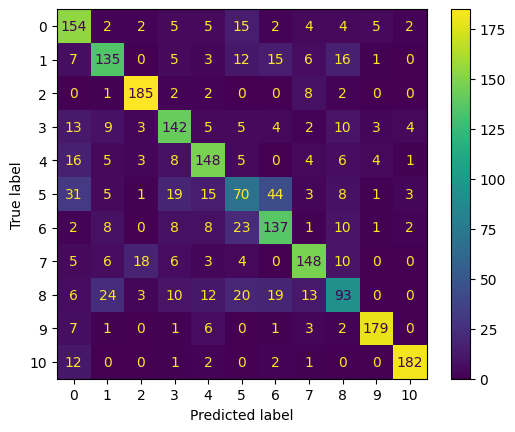

In [75]:
# We will plotting the confusion matrix.
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model_logistic_bow.classes_)
disp.plot()

plt.show()

In [73]:
# Here we have printed classification report for the classifier.
print(classification_report(y_test, predictions_logistic_bow))

              precision    recall  f1-score   support

           0       0.61      0.77      0.68       200
           1       0.69      0.68      0.68       200
           2       0.86      0.93      0.89       200
           3       0.69      0.71      0.70       200
           4       0.71      0.74      0.72       200
           5       0.45      0.35      0.40       200
           6       0.61      0.69      0.65       200
           7       0.77      0.74      0.75       200
           8       0.58      0.47      0.52       200
           9       0.92      0.90      0.91       200
          10       0.94      0.91      0.92       200

    accuracy                           0.71      2200
   macro avg       0.71      0.71      0.71      2200
weighted avg       0.71      0.71      0.71      2200



### Naive Bayes

In [76]:
# we assign the output to an object called model.
model_nb_bow = GaussianNB()

In [77]:
# Here, we are using XGBClassifier as a Machine Learning model to fit the data.
model_nb_bow.fit(X_train_bow, y_train)

GaussianNB()

In [78]:
predicted_nb_bow = model_nb_bow.predict(X_test_bow)

In [79]:
# Here we have printed confusion matrix for the classifier.
print(confusion_matrix(y_test, predicted_nb_bow))

[[ 86   9   6   7   0   8   6  17   0  33  28]
 [  0 126   2   1   3  11  18  25   4   9   1]
 [  0   0 176   0   4   0   1  13   3   3   0]
 [ 22   9   6  77  11   3  13  14   2  14  29]
 [  4   7   7   5 125   5   9   5   5  11  17]
 [ 22  18   6  20   4  35  48   2   5   8  32]
 [  2  15   1   9   6   4 129   8   0   1  25]
 [  5   5  28   3   3   5   4 127   7  13   0]
 [  5  25   7  11   7   5  22  60  51   4   3]
 [  0   0   6   1   8   0   2   1   7 175   0]
 [  9   2   1   0   0   1   3  19   0   1 164]]


In [80]:
cm = confusion_matrix(y_test, predicted_nb_bow, labels=model_nb_bow.classes_)

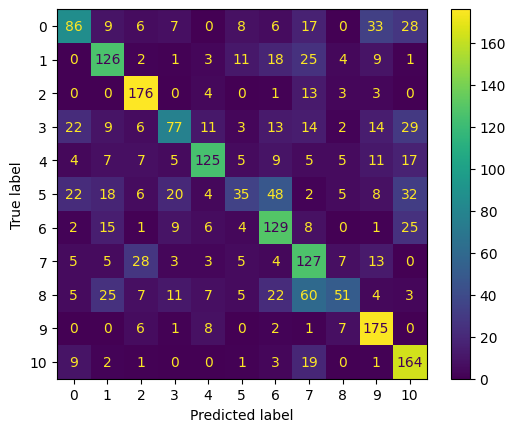

In [81]:
# We will plotting the confusion matrix.
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model_nb_bow.classes_)
disp.plot()

plt.show()

In [82]:
# Here we have printed classification report for the classifier.
print(classification_report(y_test, predicted_nb_bow))

              precision    recall  f1-score   support

           0       0.55      0.43      0.48       200
           1       0.58      0.63      0.61       200
           2       0.72      0.88      0.79       200
           3       0.57      0.39      0.46       200
           4       0.73      0.62      0.67       200
           5       0.45      0.17      0.25       200
           6       0.51      0.65      0.57       200
           7       0.44      0.64      0.52       200
           8       0.61      0.26      0.36       200
           9       0.64      0.88      0.74       200
          10       0.55      0.82      0.66       200

    accuracy                           0.58      2200
   macro avg       0.58      0.58      0.56      2200
weighted avg       0.58      0.58      0.56      2200



# WordCloud

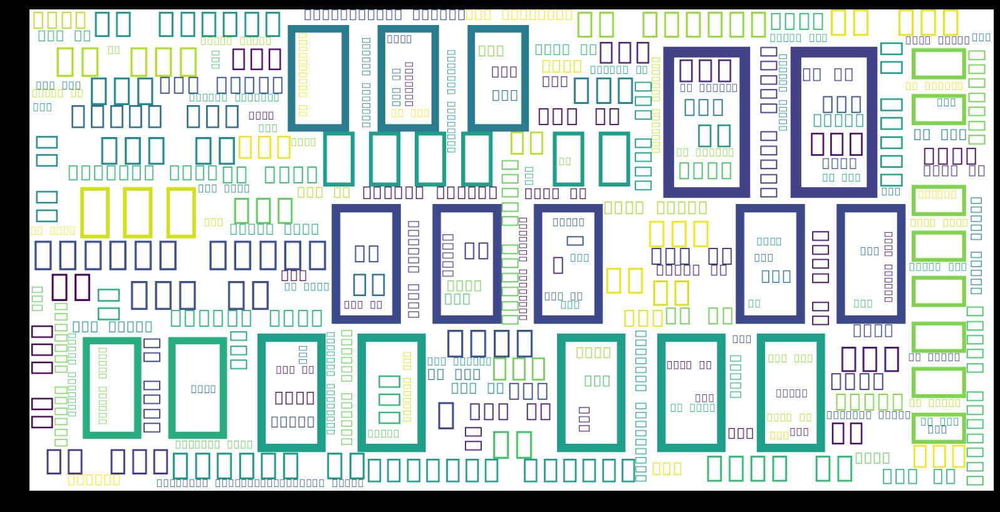

In [83]:
wordcloud = WordCloud(background_color="white",width=1600, height=800).generate(' '.join(All_train_data['story']))
plt.figure( figsize=(20,10), facecolor='k')
plt.imshow(wordcloud)